In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from geopy.distance import geodesic

In [13]:
df = pd.read_csv('../material/od.csv')

In [14]:
# convert origin_time and end_time to datatime object
df['origin_time'] = pd.to_datetime(df['origin_time'])
df['origin_time'] = df['origin_time'].apply(lambda x:x.replace(year=2013,month=10,day=22))
df['end_time'] = pd.to_datetime(df['end_time'])
df['end_time'] = df['end_time'].apply(lambda x:x.replace(year=2013,month=10,day=22))

In [15]:
# convert lon, lat to float
df['origin_lon'] = df['origin_lon'].astype('float')
df['origin_lat'] = df['origin_lat'].astype('float')
df['destination_lon'] = df['destination_lon'].astype('float')
df['destination_lat'] = df['destination_lat'].astype('float')

In [16]:
# calculate distance from origin to destination
df['distance'] = df.apply(lambda x: geodesic((x.origin_lat,x.origin_lon),(x.destination_lat,x.destination_lon)).km,axis=1)

In [17]:
# calculate travel time
df['travel_time'] = df['end_time']-df['origin_time']
df['travel_time'] = df['travel_time'].dt.total_seconds().div(60).astype(float)

In [25]:
df_clean = df.drop(df[(df['travel_time']+5<df['distance'])].index)
df_show = df_clean[df_clean['travel_time']<200]
# df=df[df['travel_time']<200]
# df_clean = df.iloc[:,1:-2]
# df_clean.to_csv('../material/od.csv')

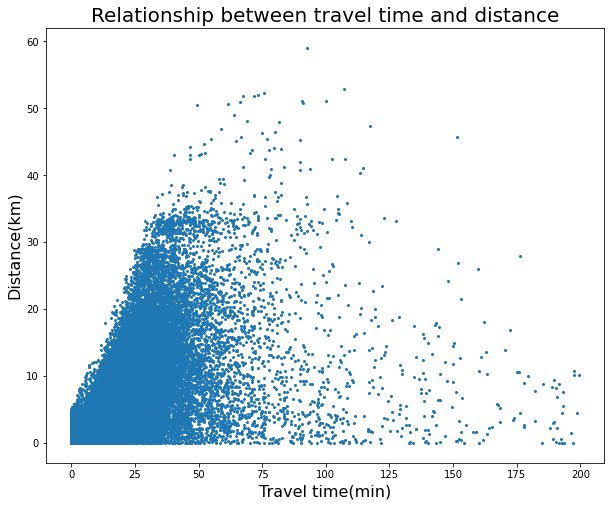

In [31]:
# plot
plt.figure(figsize=(10,8))
plt.scatter(df_show['travel_time'],df_show['distance'],s=4)
plt.xlabel('Travel time(min)',fontdict={'size':16})
plt.ylabel('Distance(km)',fontdict={'size':16})
plt.title('Relationship between travel time and distance',fontdict={'size':20})
plt.savefig('travel distance vs.time.png')
plt.show()